# FastGAN
Curso: [Aprendizaje Profundo](http://turing.iimas.unam.mx/~gibranfp/cursos/aprendizaje_profundo/). Profesor: [Gibran Fuentes Pineda](http://turing.iimas.unam.mx/~gibranfp/). Ayudante: [Emilio Morales](https://github.com/milmor).
- En este notebook se define y entrena una arquitectura basada en [FastGAN](https://arxiv.org/abs/2101.04775).

In [2]:
import torch
import torchvision
import matplotlib.pyplot as plt
from torchvision import transforms
from torch import nn
from torch import optim
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import time
from model import dataManipulator, const

torch.manual_seed(77)
np.random.seed(77)

/home/ariel/anaconda3/envs/pytorch/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1.- Dataset
- Se utiliza el conjunto de prueba de CIFAR10 que consiste en 10k imágenes.

In [3]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(256)
    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

batch_size = 128

#test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False,
 #                                      download=True, transform=transform)
 
test_dataset = dataManipulator.Lens2(const.PATH_OF_PREDOs_PC, transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=4)

In [4]:
test_batch, test_labels = next(iter(test_loader))
test_batch.shape, test_labels.shape

RuntimeError: Caught RuntimeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/ariel/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/_utils/worker.py", line 198, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/ariel/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/_utils/fetch.py", line 47, in fetch
    return self.collate_fn(data)
  File "/home/ariel/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 83, in default_collate
    return [default_collate(samples) for samples in transposed]
  File "/home/ariel/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 83, in <listcomp>
    return [default_collate(samples) for samples in transposed]
  File "/home/ariel/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 55, in default_collate
    return torch.stack(batch, 0, out=out)
RuntimeError: stack expects each tensor to be equal size, but got [3, 800, 800] at entry 0 and [3, 256, 256] at entry 27


## 2.- Modelo
### Generador

In [4]:
import torch.nn as nn

In [5]:
def upBlock(in_planes, out_planes):
    block = nn.Sequential(
        nn.Upsample(scale_factor=2, mode='nearest'),
        nn.Conv2d(in_planes, out_planes, 3, 1, 1, bias=False),
        nn.BatchNorm2d(out_planes),
        nn.LeakyReLU(0.2),
        nn.Conv2d(out_planes, out_planes, 3, 1, 1, bias=False),
        nn.BatchNorm2d(out_planes),
        nn.LeakyReLU(0.2)
    )
    return block

In [6]:
class Generator(nn.Module):
    def __init__(self, filters=128, noise_dim=64):
        super(Generator, self).__init__()
        self.filters = filters
        self.init = nn.Sequential(
            nn.Linear(noise_dim, filters * 4 * 4),
            nn.BatchNorm1d(filters * 4 * 4),
            nn.LeakyReLU(0.2),
        )             
        
        self.feat_8   = upBlock(filters, filters)
        self.feat_16  = upBlock(filters, filters // 2)
        self.feat_32  = upBlock(filters // 2, filters // 4)
        
        self.ch_conv = nn.Conv2d(filters // 4, 3, 3, 1, 1, bias=False)

    def forward(self, z):
        feat_4 = self.init(z)
        feat_4 = torch.reshape(feat_4, (-1, self.filters, 4, 4))
        feat_8 = self.feat_8(feat_4)
        feat_16 = self.feat_16(feat_8)
        feat_32 = self.feat_32(feat_16)

        img = torch.tanh(self.ch_conv(feat_32))
        return img
    
    
noise_dim = 64
noise = torch.randn(batch_size, noise_dim)
generator = Generator(128, noise_dim)
gen_batch = generator(noise)
gen_batch.shape

torch.Size([128, 3, 32, 32])

In [7]:
from torchsummary import summary

### Discriminador

In [ ]:
class DownBlockComp(nn.Module):
    def __init__(self, in_planes, out_planes):
        super(DownBlockComp, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(in_planes, out_planes, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_planes), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(out_planes, out_planes, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_planes), nn.LeakyReLU(0.2, inplace=True)
        )

        self.direct = nn.Sequential(
            nn.AvgPool2d(2, 2),
            nn.Conv2d(in_planes, out_planes, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_planes), nn.LeakyReLU(0.2, inplace=True))

    def forward(self, feat):
        return (self.main(feat) + self.direct(feat)) / 2

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, filters=128, noise_dim=64):
        super(Discriminator, self).__init__()
        self.down_from_big = nn.Sequential(
            nn.Conv2d(3, filters // 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(filters // 8), nn.LeakyReLU(0.2, inplace=True),
        )
        self.down_16 = DownBlockComp(filters // 8, filters // 4)
        self.down_8 = DownBlockComp(filters // 4, filters // 2)
        self.down_4 = DownBlockComp(filters // 2, filters)

        self.logits = nn.Sequential(
            nn.Conv2d(filters, filters, 1, 1, 0, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(filters, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        x = self.down_from_big(x)
        x = self.down_16(x)
        x = self.down_8(x)
        x = self.down_4(x)
        x = self.logits(x).view(-1, 1)
        return x
    
    
discriminator = Discriminator(128)
out_disc = discriminator(test_batch)
out_disc.shape

torch.Size([128, 1])

## 3.- Entrenamiento

In [ ]:
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    if classname.find('Linear') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [ ]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cuda:0'

In [ ]:
g_lr = 0.0001
d_lr = 0.0001
beta1 = 0.5
beta2 = 0.9

generator.to(device)
generator.apply(weights_init)
discriminator.to(device)
discriminator.apply(weights_init)
g_optimizer = optim.Adam(generator.parameters(), lr=g_lr, betas=(beta1, beta2))
d_optimizer = optim.Adam(discriminator.parameters(), lr=d_lr, betas=(beta1, beta2))

loss_fn = nn.BCELoss()

In [ ]:
def deprocess(img):
    return img * 127.5 + 127.5

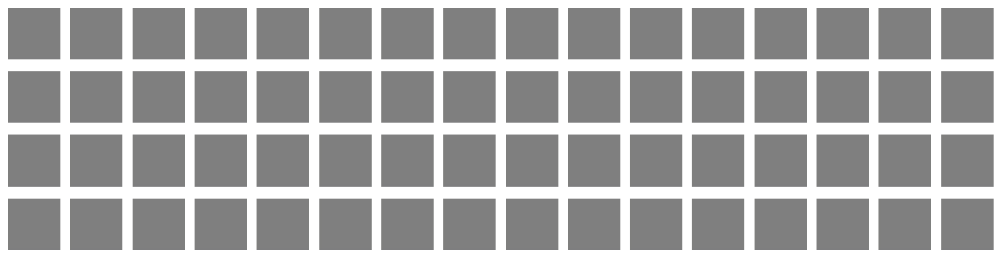

In [ ]:
def plot_batch(generator, device):
    n_images = 64
    generator.eval()
    noise = torch.randn(batch_size, noise_dim, device=device)

    gen_batch = generator(noise).detach().cpu()
    plt.figure(figsize=(16, 4))
    
    plot_batch = deprocess(gen_batch)
    for i in range(n_images):
        plt.subplot(4, 16, i+1)
        plt.imshow(np.transpose(plot_batch[i], [1, 2, 0]).numpy().astype("uint8"))
        plt.axis('off')
    plt.show()
    
plot_batch(generator, device)

In [ ]:
epochs = 500
plot_inter = 50

def train(generator, discriminator, g_opt, d_opt, data_loader, 
          loss_fn, epochs, plot_inter, device):
    
    generator.train()
    discriminator.train()

    for epoch in range(epochs):
        g_loss_avg = 0.0
        d_loss_avg = 0.0
        start = time.time()
        for real_img, _ in data_loader:
             # Train the generator
            real_img = real_img.to(device)
            real_img = 2.0 * real_img - 1.0
            
            generator.zero_grad()
            batch_size = real_img.shape[0]
            noise = torch.randn(batch_size, noise_dim, device=device)
            real_labels = torch.ones((batch_size, 1)).to(device)
            fake_labels = torch.zeros((batch_size, 1)).to(device)
            gen_img = generator(noise)
            fake_out = discriminator(gen_img)

            g_loss = loss_fn(fake_out, real_labels)
            g_loss.backward()
            g_opt.step()

            # Train the discriminator
            discriminator.zero_grad()
            real_out = discriminator(real_img)
            disc_real_loss = loss_fn(real_out, real_labels)
            fake_out = discriminator(gen_img.detach())
            disc_fake_loss = loss_fn(fake_out, fake_labels)

            d_loss = (disc_real_loss + disc_fake_loss) / 2.0
            d_loss.backward()
            d_opt.step()
            
            # Metrics
            g_loss_avg += g_loss.item()
            d_loss_avg += d_loss.item()

        g_loss_avg /= len(data_loader)
        d_loss_avg /= len(data_loader)

        if epoch % plot_inter == 0:
            print(f'Time for epoch {epoch} is {time.time()-start:.4f} sec G loss: {g_loss_avg:.4f} D loss: {d_loss_avg:.4f}')
            plot_batch(generator, device)

Time for epoch 0 is 2.2131 sec G loss: 0.7416 D loss: 0.6476


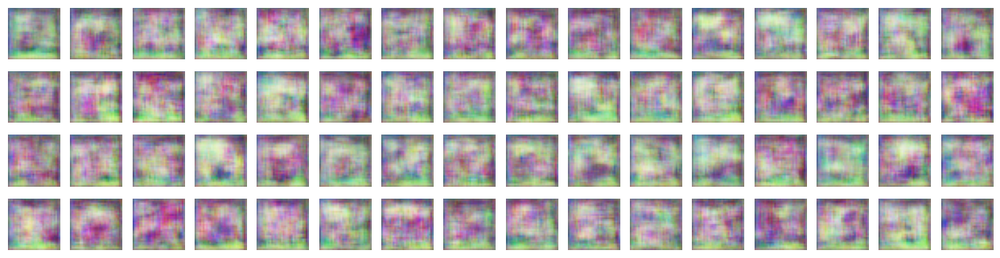

Time for epoch 50 is 1.9955 sec G loss: 1.4451 D loss: 0.4668


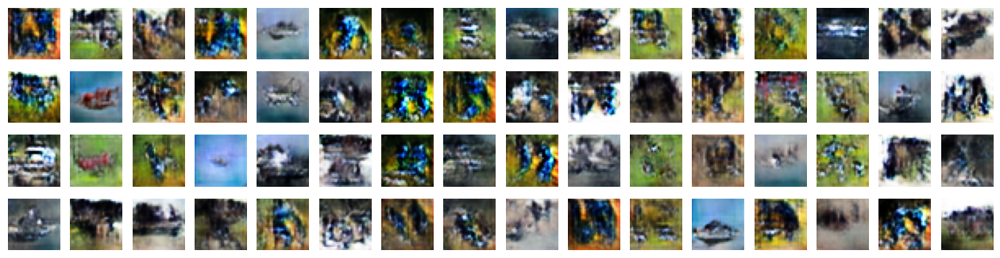

Time for epoch 100 is 1.9665 sec G loss: 1.8224 D loss: 0.3577


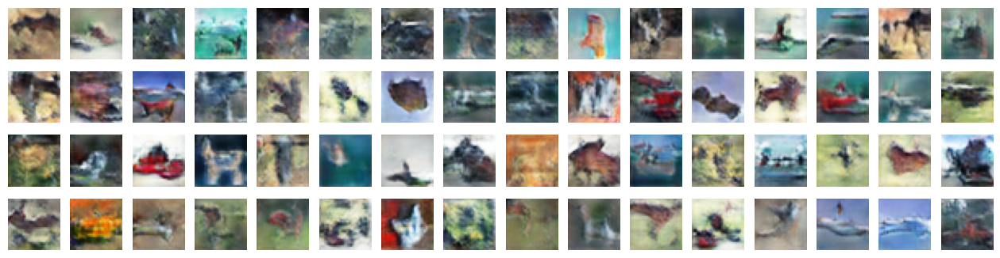

Time for epoch 150 is 2.0233 sec G loss: 3.0296 D loss: 0.2035


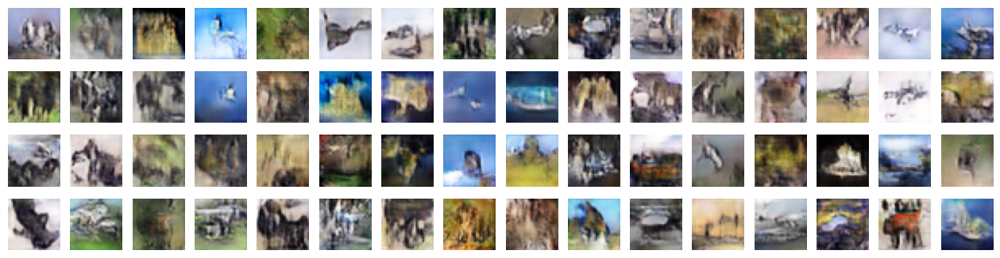

Time for epoch 200 is 1.9950 sec G loss: 4.2040 D loss: 0.1155


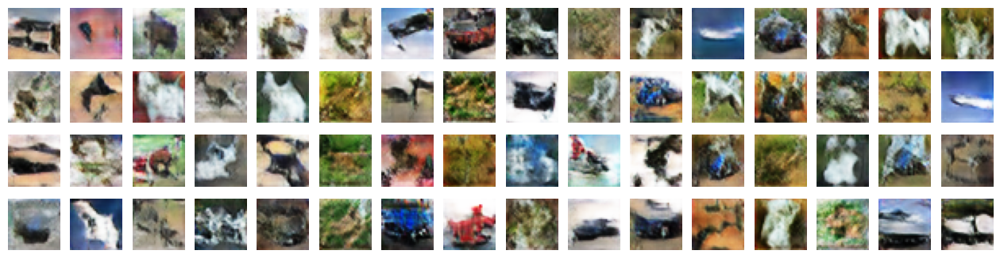

Time for epoch 250 is 1.9612 sec G loss: 5.8035 D loss: 0.1417


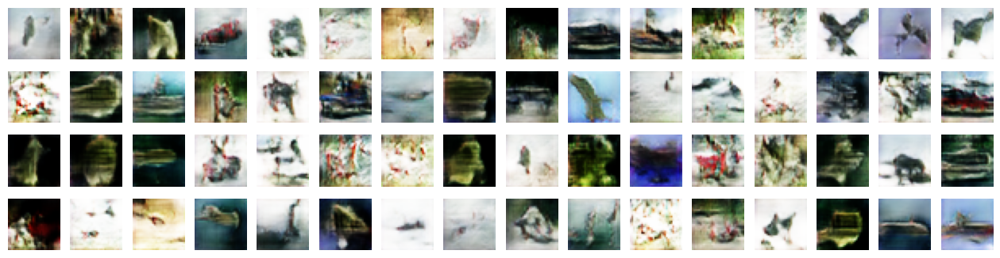

Time for epoch 300 is 1.9222 sec G loss: 5.0613 D loss: 0.1104


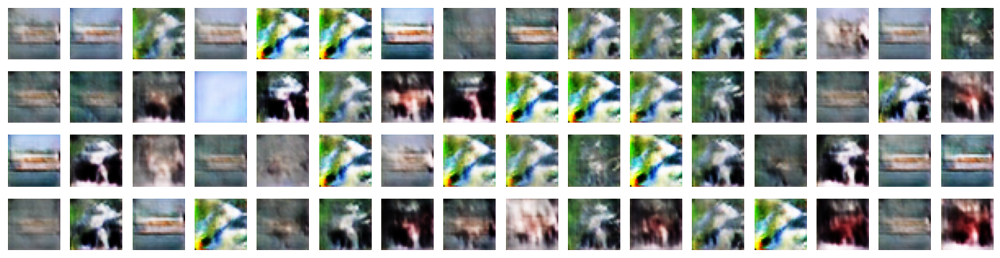

Time for epoch 350 is 1.9408 sec G loss: 5.5251 D loss: 0.1288


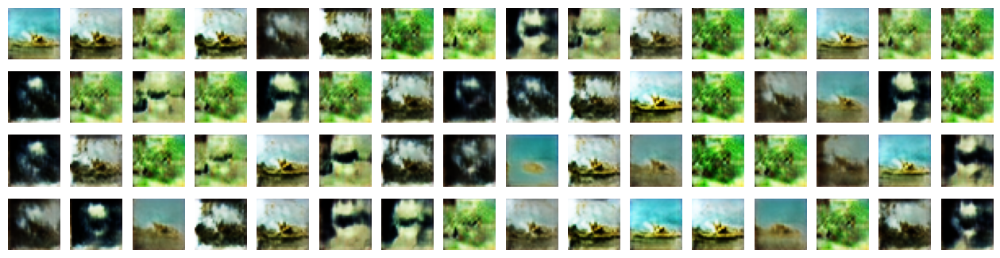

Time for epoch 400 is 1.9302 sec G loss: 4.4946 D loss: 0.1005


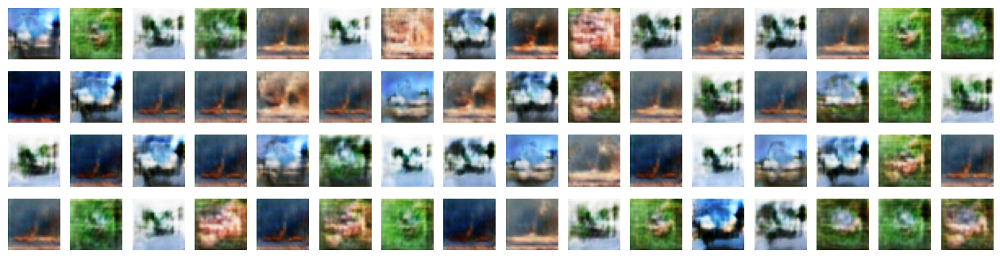

Time for epoch 450 is 1.9394 sec G loss: 4.4446 D loss: 0.1761


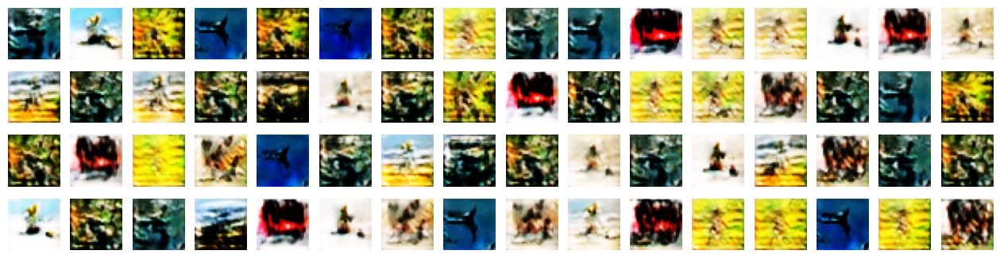

In [ ]:
train(generator, discriminator, g_optimizer, d_optimizer, 
        test_loader, loss_fn, epochs, plot_inter, device)

In [ ]:
# Differentiable Augmentation for Data-Efficient GAN Training
# Shengyu Zhao, Zhijian Liu, Ji Lin, Jun-Yan Zhu, and Song Han
# https://arxiv.org/pdf/2006.10738

import torch
import torch.nn.functional as F


def DiffAugment(x, policy='', channels_first=True):
    if policy:
        if not channels_first:
            x = x.permute(0, 3, 1, 2)
        for p in policy.split(','):
            for f in AUGMENT_FNS[p]:
                x = f(x)
        if not channels_first:
            x = x.permute(0, 2, 3, 1)
        x = x.contiguous()
    return x


def rand_brightness(x):
    x = x + (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) - 0.5)
    return x


def rand_saturation(x):
    x_mean = x.mean(dim=1, keepdim=True)
    x = (x - x_mean) * (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) * 2) + x_mean
    return x


def rand_contrast(x):
    x_mean = x.mean(dim=[1, 2, 3], keepdim=True)
    x = (x - x_mean) * (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) + 0.5) + x_mean
    return x


def rand_translation(x, ratio=0.125):
    shift_x, shift_y = int(x.size(2) * ratio + 0.5), int(x.size(3) * ratio + 0.5)
    translation_x = torch.randint(-shift_x, shift_x + 1, size=[x.size(0), 1, 1], device=x.device)
    translation_y = torch.randint(-shift_y, shift_y + 1, size=[x.size(0), 1, 1], device=x.device)
    grid_batch, grid_x, grid_y = torch.meshgrid(
        torch.arange(x.size(0), dtype=torch.long, device=x.device),
        torch.arange(x.size(2), dtype=torch.long, device=x.device),
        torch.arange(x.size(3), dtype=torch.long, device=x.device),
    )
    grid_x = torch.clamp(grid_x + translation_x + 1, 0, x.size(2) + 1)
    grid_y = torch.clamp(grid_y + translation_y + 1, 0, x.size(3) + 1)
    x_pad = F.pad(x, [1, 1, 1, 1, 0, 0, 0, 0])
    x = x_pad.permute(0, 2, 3, 1).contiguous()[grid_batch, grid_x, grid_y].permute(0, 3, 1, 2).contiguous()
    return x


def rand_cutout(x, ratio=0.5):
    cutout_size = int(x.size(2) * ratio + 0.5), int(x.size(3) * ratio + 0.5)
    offset_x = torch.randint(0, x.size(2) + (1 - cutout_size[0] % 2), size=[x.size(0), 1, 1], device=x.device)
    offset_y = torch.randint(0, x.size(3) + (1 - cutout_size[1] % 2), size=[x.size(0), 1, 1], device=x.device)
    grid_batch, grid_x, grid_y = torch.meshgrid(
        torch.arange(x.size(0), dtype=torch.long, device=x.device),
        torch.arange(cutout_size[0], dtype=torch.long, device=x.device),
        torch.arange(cutout_size[1], dtype=torch.long, device=x.device),
    )
    grid_x = torch.clamp(grid_x + offset_x - cutout_size[0] // 2, min=0, max=x.size(2) - 1)
    grid_y = torch.clamp(grid_y + offset_y - cutout_size[1] // 2, min=0, max=x.size(3) - 1)
    mask = torch.ones(x.size(0), x.size(2), x.size(3), dtype=x.dtype, device=x.device)
    mask[grid_batch, grid_x, grid_y] = 0
    x = x * mask.unsqueeze(1)
    return x


AUGMENT_FNS = {
    'color': [rand_brightness, rand_saturation, rand_contrast],
    'translation': [rand_translation],
    'cutout': [rand_cutout],
}

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, filters=128, noise_dim=64):
        super(Discriminator, self).__init__()
        self.down_from_big = nn.Sequential(
            nn.Conv2d(3, filters // 8, 3, 1, 1, bias=False),
            nn.BatchNorm2d(filters // 8), nn.LeakyReLU(0.2, inplace=True),
        )
        self.down_16 = DownBlockComp(filters // 8, filters // 4)
        self.down_8 = DownBlockComp(filters // 4, filters // 2)
        self.down_4 = DownBlockComp(filters // 2, filters)

        self.logits = nn.Sequential(
            nn.Conv2d(filters, filters, 1, 1, 0, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(filters, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        x = DiffAugment(x, 'color,translation,cutout')
        x = self.down_from_big(x)
        x = self.down_16(x)
        x = self.down_8(x)
        x = self.down_4(x)
        x = self.logits(x).view(-1, 1)
        return x
    
    
diff_discriminator = Discriminator(128)
out_disc = diff_discriminator(test_batch)
out_disc.shape

torch.Size([128, 1])

Time for epoch 0 is 2.2837 sec G loss: 0.7312 D loss: 0.6722


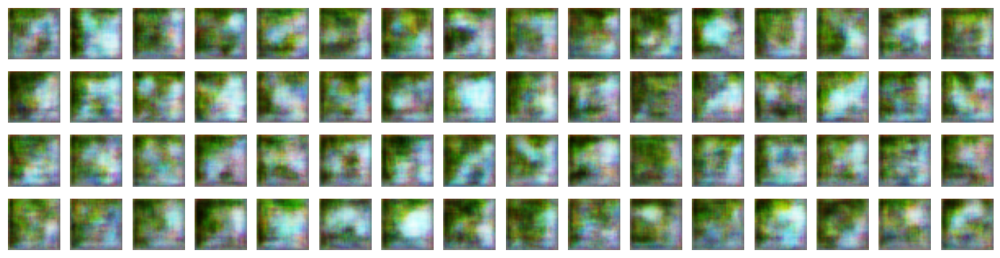

Time for epoch 50 is 2.2652 sec G loss: 1.2052 D loss: 0.5569


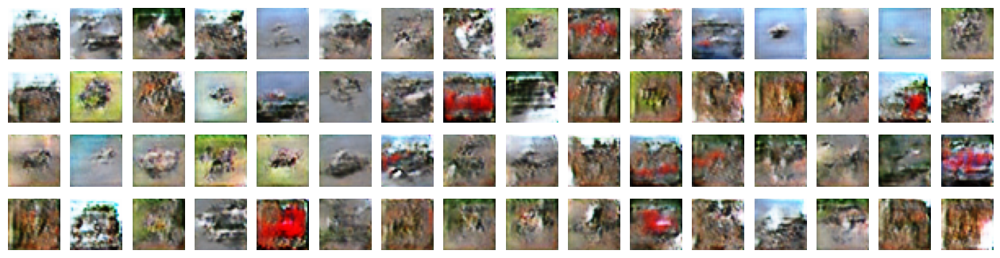

Time for epoch 100 is 2.2319 sec G loss: 1.3155 D loss: 0.5055


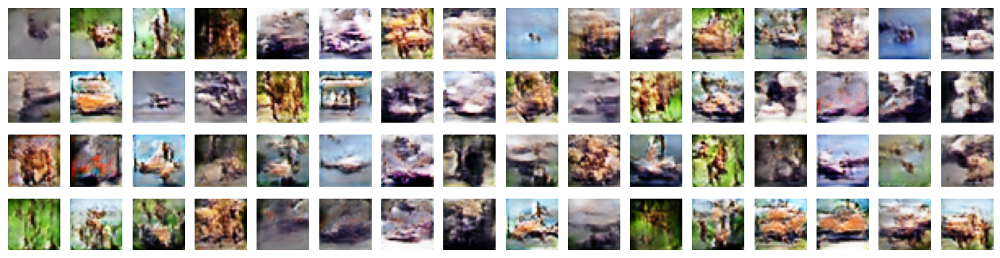

Time for epoch 150 is 2.2285 sec G loss: 1.2293 D loss: 0.5685


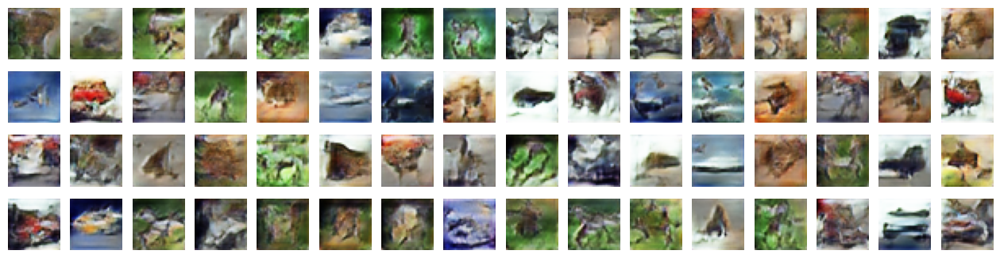

Time for epoch 200 is 2.2189 sec G loss: 1.1714 D loss: 0.5856


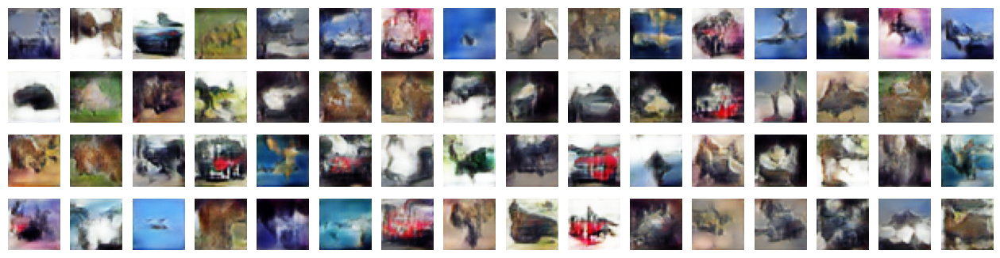

Time for epoch 250 is 2.2436 sec G loss: 1.3185 D loss: 0.5309


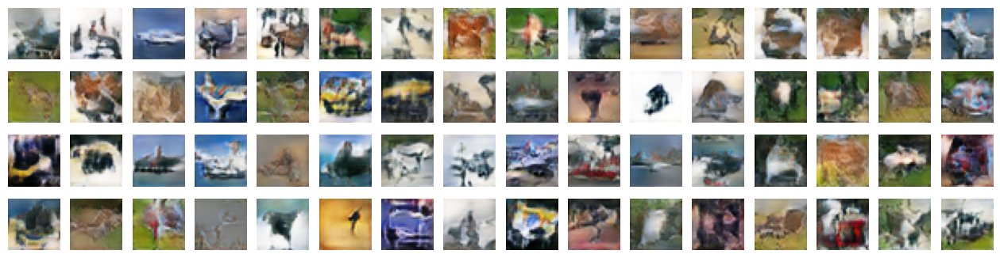

Time for epoch 300 is 2.2224 sec G loss: 1.2694 D loss: 0.5387


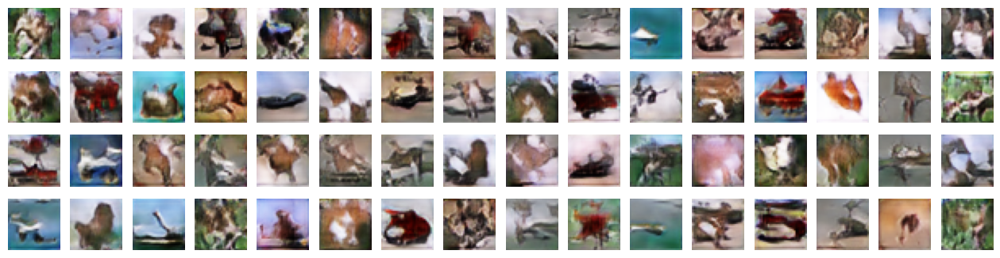

Time for epoch 350 is 2.2186 sec G loss: 1.4416 D loss: 0.5433


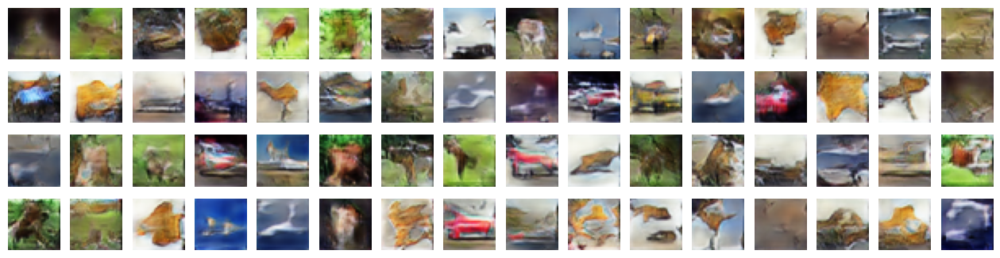

Time for epoch 400 is 2.2240 sec G loss: 1.1938 D loss: 0.5702


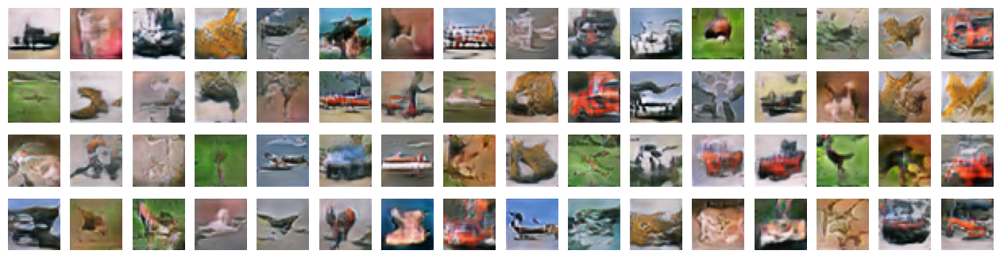

Time for epoch 450 is 2.2210 sec G loss: 1.2243 D loss: 0.5666


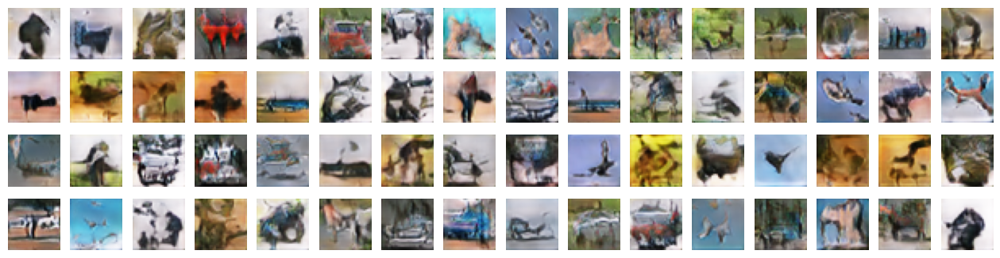

In [ ]:
diff_generator = Generator(128)
diff_generator.to(device)
diff_generator.apply(weights_init)
diff_discriminator.to(device)
diff_discriminator.apply(weights_init)
g_optimizer = optim.Adam(diff_generator.parameters(), lr=g_lr, betas=(beta1, beta2))
d_optimizer = optim.Adam(diff_discriminator.parameters(), lr=d_lr, betas=(beta1, beta2))

train(diff_generator, diff_discriminator, g_optimizer, d_optimizer, 
        test_loader, loss_fn, epochs, plot_inter, device)